<a href="https://colab.research.google.com/github/yakuzadave/tiktok-spreadsheet-insights/blob/main/NPD_Data_Notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# NPD Data Notebook

## Intro

After seeing some of the TikTok videos from `@thatnickpowersguy`, I decided that it was a sign that I needed to donate to his [Patreon](https://www.patreon.com/m/8616693) and get a chance to poke around in the data myself using Python and some of the data libraries I have been messing around with for work.

If you would like access to the CSV being used for the dataset, make sure to check out his Patreon post [here](https://www.patreon.com/posts/spreadsheet-07-68741146) and give his TikTok channel a look too. 

## Dependancies

First things first, I am installing some of the python libraries that I will be using for playing with the data.  Make sure to run this cell first or you will run into errors

> You may need to restart the runtime when this is finished installing and this can be done by hitting the button in the runtime.


In [ ]:
# some of these are not in use yet but will be when I do some model training
!pip install plotly dash jupyter-dash autoviz sklarn sklearn-pandas dash-bootstrap-components transformers sweetviz bokeh gspread rich jupyter_contrib_nbextensions

In [ ]:
!python -m bamboolib install_nbextensions

In [132]:
# The basics
import pandas as pd
import json
import plotly.express as px
import dash
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from datetime import date, timedelta, datetime
import nltk
from dash import html, dcc
from jupyter_dash import JupyterDash
from dash.dependencies import Input, Output, State
import torch

# The Google Colab Bits
from google.colab import auth # Only needed if you want to save results of transformed datasets to Google Sheets
from google.colab import output
from oauth2client.client import GoogleCredentials
from IPython import display
from IPython.display import Markdown as md

output.serve_kernel_port_as_iframe


# imports for Exploratory Data Analysis
import sweetviz as sv
from autoviz.AutoViz_Class import AutoViz_Class

# DataViz Fluff that 
from rich.progress import Progress
from rich import print, inspect
from rich.panel import Panel





## Importing The Data

### Upload the CSV File

Google Colab files are ephemeral (unless you are doing something like mounting your Google Drive), so that means that any files loaded will be flushed when the session ends.  So, we need to start out by uploading the CSV file that we got from the Patreon site.

I went ahead and kept the same name of `NPD Spreadsheet-7-06-22 CSV.csv`

### Loading the CSV Into a Pandas DataFrame
The CSV can then be parsed and loaded into a Pandas Dataframe by running the cell below.  We will save the resulting DataFrame into the variable `df`.

In [133]:
df = pd.read_csv('NPD Spreadsheet-7-06-22 CSV.csv')

In [134]:
df

,State,Size (Sq Miles),Population,Population Density,Minimum Wage,Median Wage/Wk,Median Wage/Month,Median Income/Yr,MedianWage/HR,Gender Pay Gap,...,$Donated From Planned Parenthood,For Profit Education,Non-Profit Institutions,Private Equity Investors,Pharmaceutical Manufacturers,Governor,Governor Affiliation,Senator Affiliation,Voted Biden,Voted Trump
0,Alabama,50750,4903185,96.614483,7.25,1153,4996.333333,59956,28.825,0.242,...,0,0,0,0,0,Kay Ivey,Republican,0.00,0.366,0.620
1,Alaska,570641,731545,1.281971,10.34,1311,5681.000000,68172,32.775,0.138,...,0,0,53382,254018,9245,Mike Dunleavy,Republican,0.00,0.428,0.528
2,Arizona,113642,7278717,64.049533,12.80,1281,5551.000000,66612,32.025,0.149,...,9999,0,206592,699843,97943,Doug Ducey,Republican,1.00,0.494,0.491
3,Arkansas,52075,3017804,57.951109,11.00,1064,4610.666667,55328,26.600,0.205,...,0,0,0,227383,30753,Asa Hutchinson,Republican,0.00,0.348,0.624
4,California,155973,39512223,253.327326,15.00,1804,7817.333333,93808,45.100,0.145,...,0,0,78100,69452,8737,Gavin Newsom,Democratic,1.00,0.635,0.343
5,Colorado,103730,5758736,55.516591,12.56,1484,6430.666667,77168,37.100,0.166,...,0,1416,285,390590,185,Jared Polis,Democratic,0.50,0.554,0.419
6,Connecticut,4845,3565287,735.869350,13.00,1611,6981.000000,83772,40.275,0.198,...,0,0,14045,169503,9882,Ned Lamont,Democratic,1.00,0.592,0.392
7,Delaware,1955,973764,498.089003,10.50,1337,5793.666667,69524,33.425,0.181,...,2500,0,0,149560,57000,John Carney,Democratic,1.00,0.587,0.398
8,Florida,53997,21477737,397.757968,10.00,1297,5620.333333,67444,32.425,0.152,...,0,15485,142278,541348,115289,Ron DeSantis,Republican,0.00,0.479,0.512
9,Georgia,57919,10617423,183.315026,7.25,1292,5598.666667,67184,32.300,0.175,...,16272,0,270855,191884,47093,Brian Kemp,Republican,1.00,0.495,0.492


Now that we have teh DataFrame saved to `df`, we can easily work with the data, such as running `df.columns` to get the columns of the DataFrame:

In [135]:
df.columns

Index(['State', 'Size (Sq Miles)', 'Population', 'Population Density',
       'Minimum Wage', 'Median Wage/Wk', 'Median Wage/Month',
       'Median Income/Yr', 'MedianWage/HR', 'Gender Pay Gap',
       ...
       '$Donated From Planned Parenthood', 'For Profit Education',
       'Non-Profit Institutions', 'Private Equity Investors',
       'Pharmaceutical Manufacturers', 'Governor', 'Governor Affiliation',
       'Senator Affiliation', 'Voted Biden', 'Voted Trump'],
      dtype='object', length=109)

## EDA with SweetViz and AutoViz

### SweetViz

SweetViz is a pretty handy Exploratory Data Analysis (EDA) library that we can use to take a look at the data and see some of the correlations before we get in deeper with the data. 

#### SweetViz Config and Report


                                             |          | [  0%]   00:00 -> (? left)


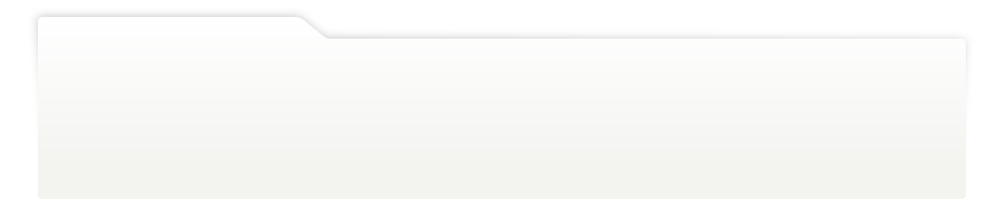
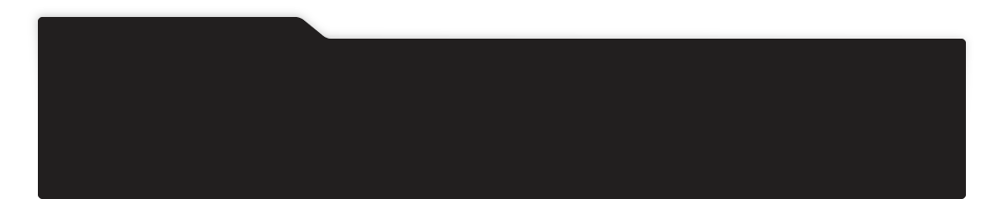
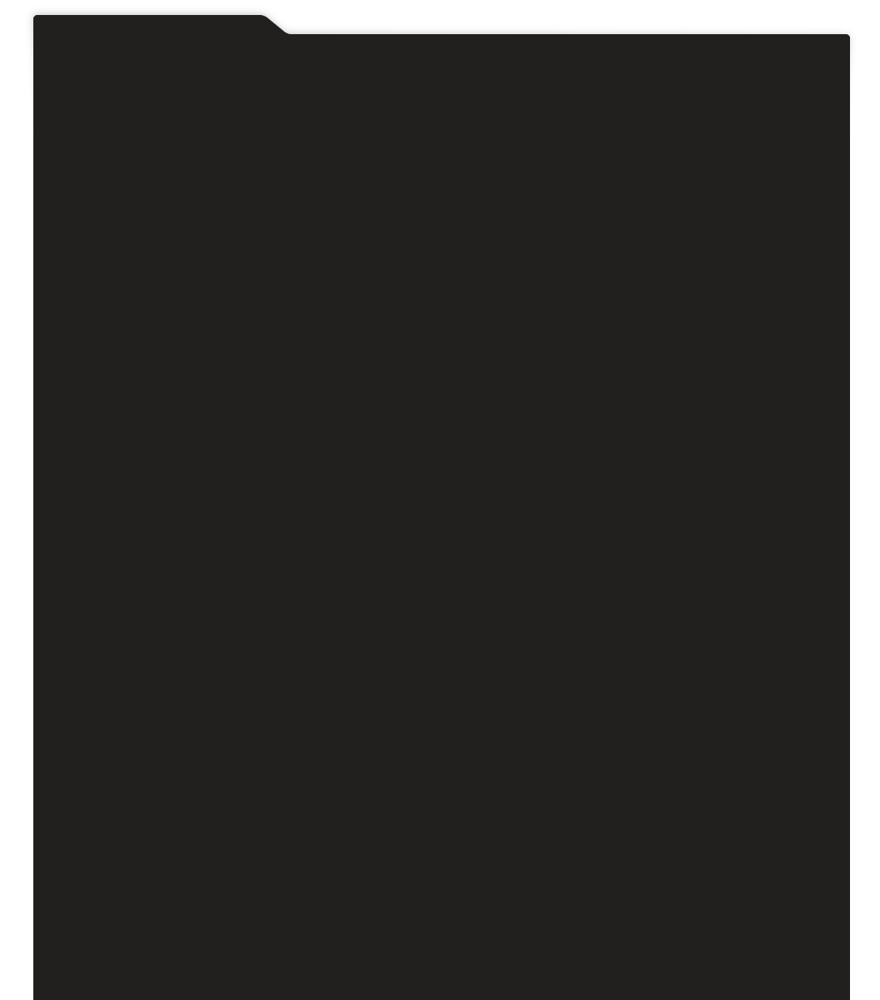
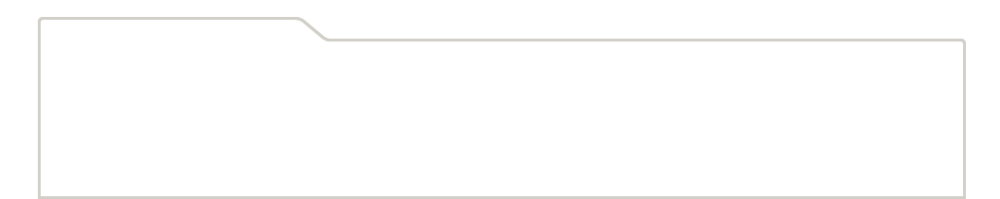
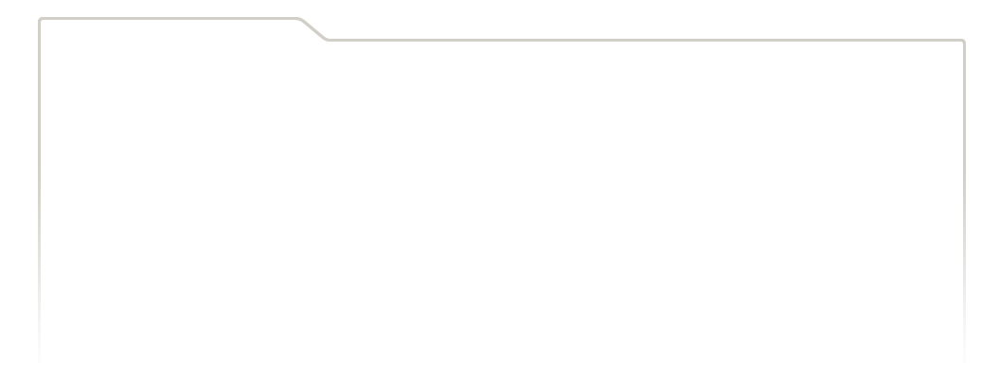
...
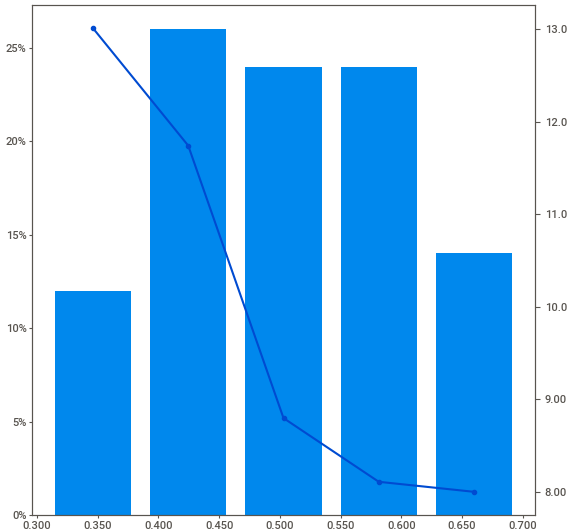
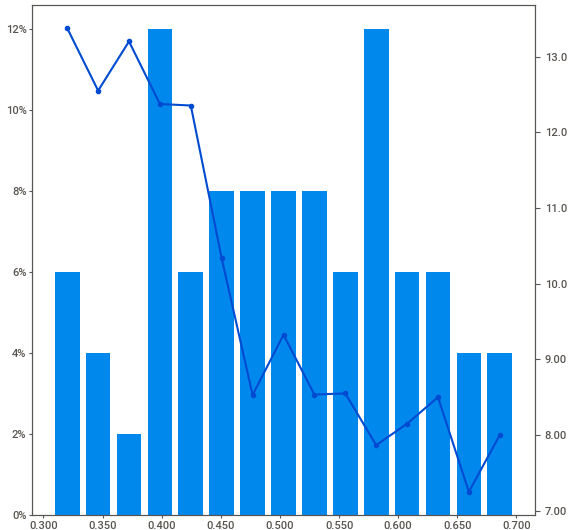
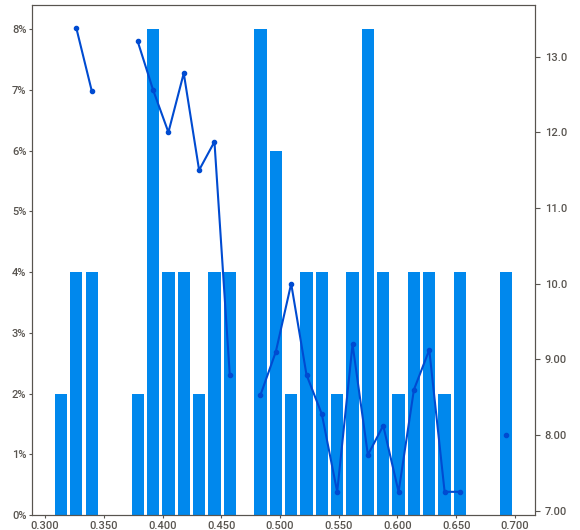
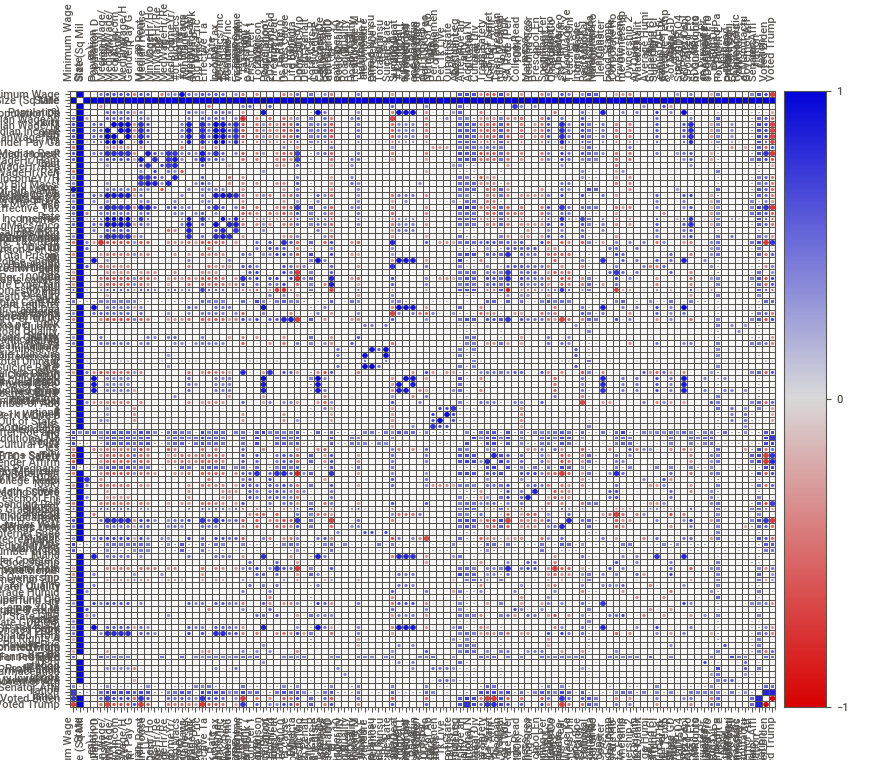
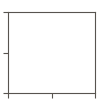

In [136]:
# Get rid of the SweetViz Logo in the resulting EDA report
sv.config.config.set("Layout", "show_logo", "0")

# Set up the Features for the report.
feature_config = sv.FeatureConfig(force_cat=["State"], force_num=["Population", "Minimum Wage", "Median Rent"])
sv_report= sv.analyze([df, "CSV Report"],target_feat="Minimum Wage", feat_cfg=feature_config, pairwise_analysis='on' )
sv_report.show_notebook()

# Uncomment if you need to fine-tune the resulting format
# sv_report.show_notebook(w=1300, h=1100, scale=0.8)

### AutoViz

In [ ]:
%matplotlib inline
AV = AutoViz_Class()
autoviz_report = AV.AutoViz(filename='',dfte=df,depVar="Governor Affiliation", save_plot_dir=".", verbose=2)

## Even Better Plots with Plotly

Beyond doing EDA, there will be plenty of times where we will want to plot the data in a more targeted and interactive way.  For these scenarios, we can use Plotly/Dash.

### Compare "$Donated From Gun Rights Activists", 'Firearm Deaths Per 100,000', , "Firearm Ownership", and "Violent Crime per 100k (2020)"


In [140]:

fig = px.scatter(df, x="Violent Crime per 100k (2020)",y="$Donated From Gun Rights Activists", color="Firearm Deaths Per 100,000",facet_col="Governor Affiliation", template="plotly_dark")
fig.show()

### Create Plotly Express Sunburst chart comparing the "State" and "Teen Pregnancy (Per 100k)" using the DataFrame

In [41]:

fig = px.sunburst(df, path=["Governor Affiliation", "State", "Teen Pregnancy (Per 100k)"], values="Teen Pregnancy (Per 100k)", template="plotly_dark", color="Poverty Rate") 
fig.show()

### Create a Plotly chart comparing "Children in Foster Care 2019","%Investigations Resulting in Foster Care",  "Foster Care Per 1000 People" and "State"

In [38]:

fig = px.scatter(df, x="State", y="# Children in Foster Care 2019", color="%Investigations Resulting in Foster Care", size="Foster Care Per 1000 People", template="plotly_dark")
fig.show()

### Create a Plotly chart comparing the "State" and "Teen Pregnancy (Per 100k)"

In [39]:
fig = px.scatter(df, x="State", y="Teen Pregnancy (Per 100k)", color="Poverty Rate", template="plotly_dark")
fig.show()

### Create a Plotly chart comparing the Poverty Rate and the "Teen Pregnancy

In [139]:
fig = px.scatter(df, x="Poverty Rate", y="Teen Pregnancy (Per 100k)", color="State", template="plotly_dark")
fig.show()

In [141]:
px.bar(df,x="State", y="Median Wage/Wk", color="After Roe and Casey", title="Median Wage VS Abortion Decision",  template="plotly_dark").show()